# LO7 Lens Quality Control

In [1]:
import sys
import os
sys.path.insert(0, "../../python")
sys.path.insert(1, "../../../photoDAQ")

import numpy as np
from lens import profile
from lens import bessel
from propagation import laser
import matplotlib.pyplot as plt
from scipy import ndimage
import file
from PIL import Image
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
plt.style.use('presentation')

path = '/media/robert/Data_Storage/Data/Experimental/Lithium_Oven_Optic_7/'
file.PATH = path

This notebook compares the images taken of the LO7 optic masks to the design to look for any discrepencies.

In [2]:
from scipy.interpolate import UnivariateSpline
def fwhm(x, y):
    y = y-np.min(y)
    spline = UnivariateSpline(x, y-np.max(y)/2, s=0)
    roots = spline.roots()
    fwhm = []
    for i in range(int(len(roots)/2)):
        r1, r2 = spline.roots()[2*i:(2*i+2)]
        fwhm.append(r2-r1)
    fwhm = np.array(fwhm)
    return fwhm

Pixel size 1.388um
The box size is 93.6px so precision is at best 0.015um
Pixel size 1.584um
The box size is 15.8px so precision is at best 0.100um


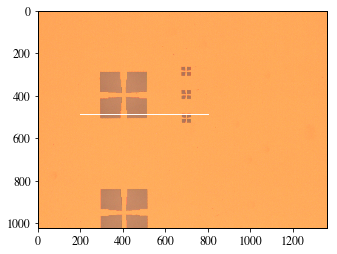

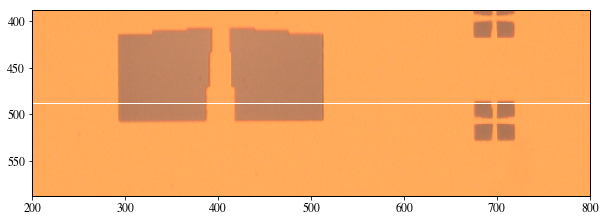

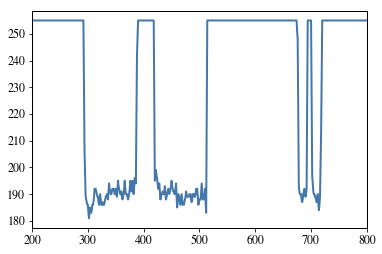

[1.38930281 1.38601167 8.22038541 7.61764061]
[0.27786056 0.27720233 1.64407708 1.52352812]


In [3]:
# First compare the alignment mark images taken for calibration
pixel_width = np.zeros(5)

a = 200
b = 800
c = 488
dc = 100
image = Image.open(path+'O1_Align2.tif')
im = np.array(image)
x = np.arange(a, b)
width = fwhm(x, im[c, a:b, 0])
px_size = 0.5*(130/width[0]+130/width[1])
px_size2 = 0.5*(26/width[2]+26/width[3])
print('Pixel size %0.3fum' % px_size)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width[0], px_size*1/width[0]))
print('Pixel size %0.3fum' % px_size2)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width[2], px_size2*1/width[2]))

plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c+dc, c-dc)
plt.show()

im = np.array(image)
plt.plot(x, im[c, a:b, 0])
plt.xlim(a, b)
plt.show()

print(130/width)
print(26/width)
pixel_width[0] = px_size

Pixel size 0.690um
The box size is 189.4px so precision is at best 0.004um
Pixel size 0.822um
The box size is 31.5px so precision is at best 0.026um


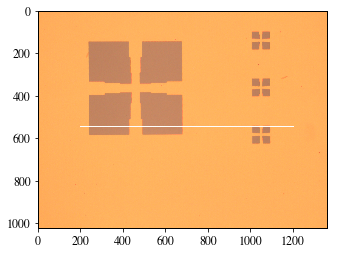

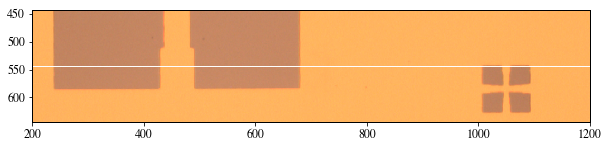

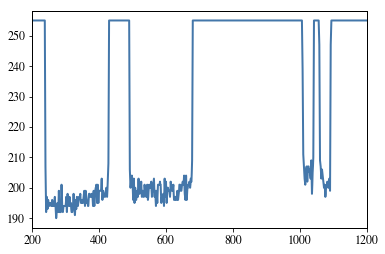

[0.68636533 0.69367678 4.12751023 4.09480634]
[0.13727307 0.13873536 0.82550205 0.81896127]


In [4]:
# First compare the alignment mark images taken for calibration
a = 200
b = 1200
c = 544
dc = 100
image = Image.open(path+'O2_Align2.tif')
im = np.array(image)
x = np.arange(a, b)
width = fwhm(x, im[c, a:b, 0])
px_size = 0.5*(130/width[0]+130/width[1])
px_size2 = 0.5*(26/width[2]+26/width[3])
print('Pixel size %0.3fum' % px_size)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width[0], px_size*1/width[0]))
print('Pixel size %0.3fum' % px_size2)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width[2], px_size2*1/width[2]))

plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c+dc, c-dc)
plt.show()

im = np.array(image)
plt.plot(x, im[c, a:b, 0])
plt.xlim(a, b)
plt.show()

print(130/width)
print(26/width)
pixel_width[1] = px_size

Pixel size 0.364um
The box size is 71.3px so precision is at best 0.005um


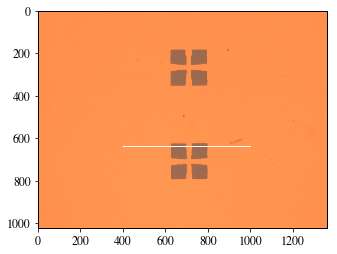

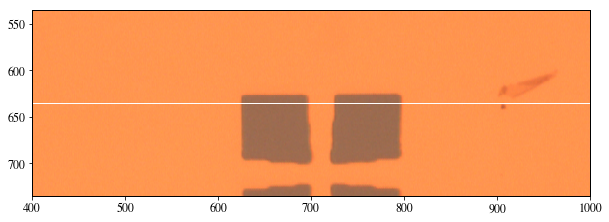

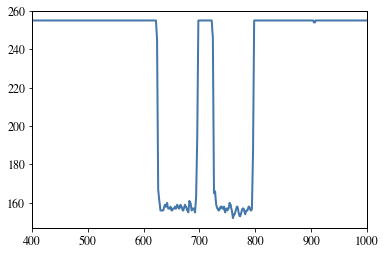

[0.36449834 0.36352749]


In [5]:
# First compare the alignment mark images taken for calibration
a = 400
b = 1000
c = 635
dc = 100
image = Image.open(path+'O3_Align2.tif')
im = np.array(image)
x = np.arange(a, b)
width = fwhm(x, im[c, a:b, 0])
px_size = 0.5*(26/width[0]+26/width[1])
print('Pixel size %0.3fum' % px_size)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width[0], px_size*1/width[0]))

plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c+dc, c-dc)
plt.show()

im = np.array(image)
plt.plot(x, im[c, a:b, 0])
plt.xlim(a, b)
plt.show()

print(26/width)
pixel_width[2] = px_size

Pixel size 0.149um
The box size is 175.0px so precision is at best 0.001um


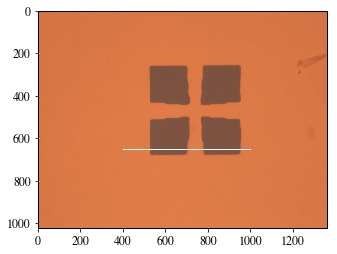

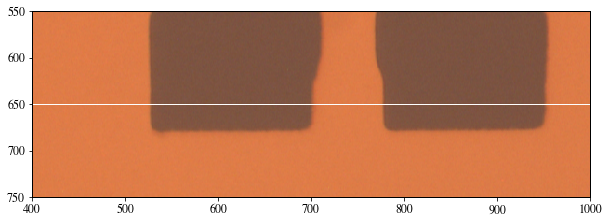

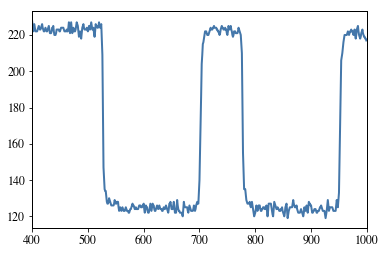

[0.1485333  0.14862483]


In [6]:
# First compare the alignment mark images taken for calibration
a = 400
b = 1000
c = 650
dc = 100
image = Image.open(path+'O4_Align2.tif')
im = np.array(image)
x = np.arange(a, b)
width = fwhm(x, im[c, a:b, 0])
px_size = 0.5*(26/width[0]+26/width[1])
print('Pixel size %0.3fum' % px_size)
print('The box size is %0.1fpx so precision is at best %0.3fum' % (width[0], px_size*1/width[0]))

plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c+dc, c-dc)
plt.show()

im = np.array(image)
plt.plot(x, im[c, a:b, 0])
plt.xlim(a, b)
plt.show()

print(26/width)
pixel_width[3] = px_size

Pixel size 0.074um
The box size is 349.4px so precision is at best 0.00021um


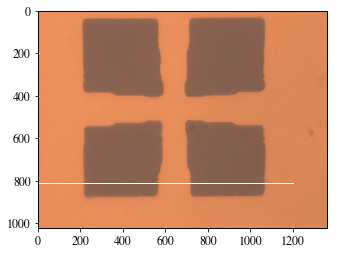

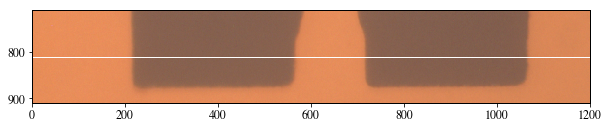

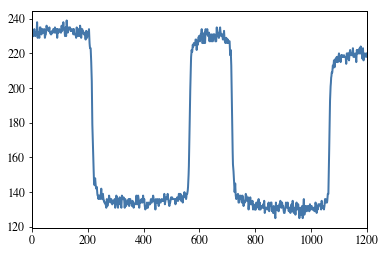

[0.07441323 0.07435372]


In [7]:
# First compare the alignment mark images taken for calibration
a = 0
b = 1200
c = 810
dc = 100
image = Image.open(path+'O5_Align2.tif')
im = np.array(image)
x = np.arange(a, b)
width = fwhm(x, im[c, a:b, 0])
px_size = 0.5*(26/width[0]+26/width[1])
print('Pixel size %0.3fum' % px_size)
print('The box size is %0.1fpx so precision is at best %0.5fum' % (width[0], px_size*1/width[0]))

plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(c+dc, c-dc)
plt.show()

im = np.array(image)
plt.plot(x, im[c, a:b, 0])
plt.xlim(a, b)
plt.show()

print(26/width)
pixel_width[4] = px_size

In [8]:
# The width of a single pixel for each resolving lens
print(pixel_width)
# Each lens clearly doubles the resolution
base = np.zeros(5)
for i in range(5):
    base[i] = pixel_width[i]/2**(4-i)
print(base)

[1.38765724 0.69002105 0.36401291 0.14857907 0.07438348]
[0.08672858 0.08625263 0.09100323 0.07428953 0.07438348]


In [9]:
layers = 8
min_feature = 2.0
data = np.load(path+'lensA_Phase.npy')
try:
    r = data[0]
    phi = data[1]
except:
    print("The numpy file doesn't have the correct format, it should be an array with:")
    print("[r, phi]")
print("Converting phase into layered rings")
phif = interp1d(r, phi, kind='cubic')
print("Creating nm resolution arrays")
N = int(r[-1]*1000)
# Radius array with exactly one point per nm (nm is base scale of gds)
r_nm = np.linspace(0, N/1000, N, endpoint=False)
phi_nm = phif(r_nm)
phi_nm = phi_nm % (2*np.pi)
phi_d = np.floor(phi_nm*layers/(2*np.pi))

# Parse the phase to find the start and end of each ring
rings = {0 : {'r':0, 'l':0}}
j = 0
phi_cur = 0
for i in range(len(r_nm)):
    if phi_d[i] != phi_cur:
        j += 1
        phi_cur = phi_d[i]
        r_tran = np.round(r_nm[i], 3)
        rings[j] = {'r':r_tran,'l':phi_cur}
        rings[j-1]['rf'] = r_tran
# Have to set the outside of the last ring and make sure it is always large enough
rings[j]['rf'] = r[-1]+min_feature
print("Finished parsing ring boundaries")

print("Converting any undersized features")
del rings[0]
delta = np.zeros(len(rings)-1)
for i in range(1, len(rings)):
    delta[i-1] = rings[i+1]['r']-rings[i]['r']

# Find each region where the phase is changing too fast
small = delta < min_feature
region = {}
j = 0
for i in range(1, len(small)):
    # Beginning of a region
    if small[i] == True and small[i-1] == False:
        region[j] = {'start' : i+1}
    # End of a region
    if small[i] == False and small[i-1] == True:
        region[j]['end'] = i+1
        j += 1
    if i == len(small)-1 and j in region:
        region[j]['end'] = i+2

for i in range(len(region)):
    start_ind = region[i]['start']
    end_ind = region[i]['end']
    start = rings[start_ind]['r']
    end = rings[end_ind]['r']
    # Remove the old rings
    for j in range(start_ind, end_ind):
        del rings[j]
    dr = end - start
    n = int(np.floor(dr / min_feature))
    dr = dr / n
    # Add in new rings
    for j in range(start_ind, start_ind+n):
        r_start = rings[j-1]['r']
        r = np.round(r_start+dr, 3)
        rf = np.round(r+dr, 3)
        sel = np.logical_and(r_nm >= r_start, r_nm < r)
        l = np.floor(np.average(phi_nm[sel])*layers/(2*np.pi))
        rings[j] = {'r':r, 'l':l, 'rf':rf}

Converting phase into layered rings
Creating nm resolution arrays
Finished parsing ring boundaries
Converting any undersized features


In [10]:
layer1 = np.ones(N)
layer2 = np.ones(N)
layer4 = np.ones(N)
Nlayers = 3
for key, ring in rings.items():
    layer = ring['l']
    depth = layers-layer-1
    for k in range(Nlayers):
        etch = 2**(Nlayers-k-1)
        if (depth/etch) >= 1:
            start = int(ring['r']*1000)
            end = int(ring['rf']*1000)
            if etch == 1:
                layer1[start:end] = 0.0
            if etch == 2:
                layer2[start:end] = 0.0
            if etch == 4:
                layer4[start:end] = 0.0
            depth = depth % etch

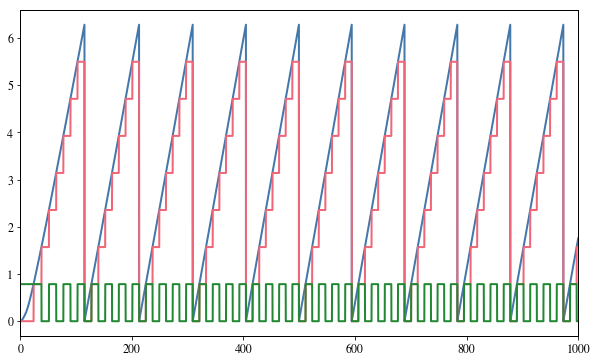

In [11]:
plt.figure(figsize=(10, 6))
plt.plot(r_nm, phi_nm)
plt.plot(r_nm, phi_d/8*2*np.pi)
plt.plot(r_nm, layer1/8*2*np.pi)
plt.xlim(0, 1000)
plt.show()

In [12]:
def plot_lineout(a, c, filename, o, x0, cor, layer, ylim):
    # Optic LO7-A1
    b = 1350
    dc = 100
    image = Image.open(path+filename)
    #image = image.convert('LA')
    im = np.array(image)

    plt.imshow(image)
    plt.plot([a, b], [c, c], 'w', linewidth=1)
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.plot([a, b], [c, c], 'w', linewidth=1)
    plt.xlim(a, b)
    plt.ylim(c+dc, c-dc)
    plt.show()

    x = ((np.arange(a, b)-a)*pixel_width[o-1]-x0)*cor
    plt.figure(figsize=(10, 2), dpi=150)
    im = np.array(image)
    plt.plot(r_nm, layer, linewidth=1.0)
    plt.ylim(-0.25, 1.25)
    plt.twinx()
    plt.plot(x, im[c, a:b, 0], 'C1', linewidth=1.0)
    plt.xlim(0, x[-1])
    plt.xlabel(r'$r$ ($\mathrm{\mu m}$)')
    plt.ylim(ylim)
    plt.show()

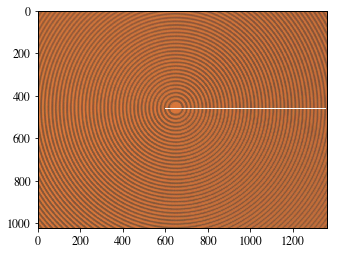

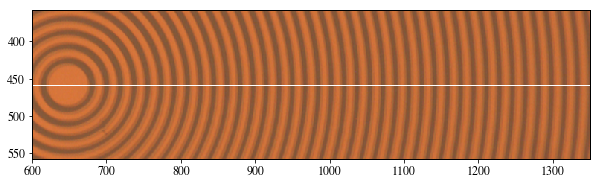

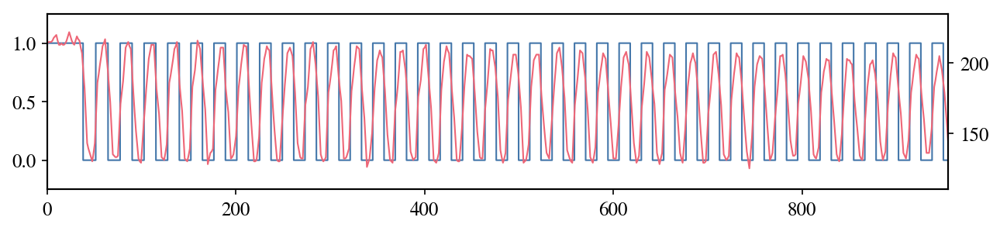

In [13]:
# Optic LO7-A1
plot_lineout(600, 458, 'LO7-A1_3/Center_O1.tif', 1, 65, 0.98, layer1, (110, 235))

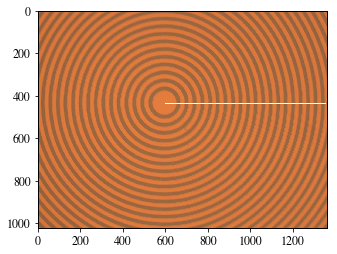

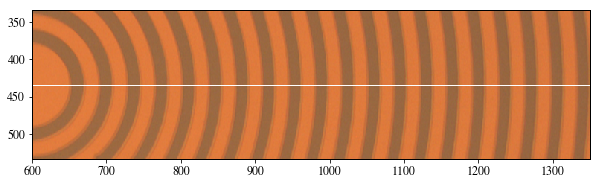

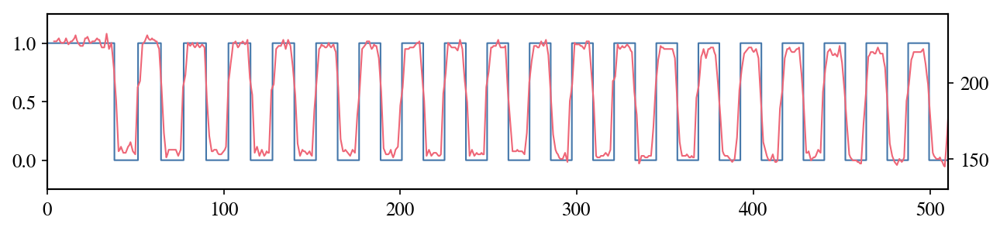

In [14]:
# Optic LO7-A1
plot_lineout(600, 434, 'LO7-A1_3/Center_O2.tif', 2, -4, 0.98, layer1, (130, 245))

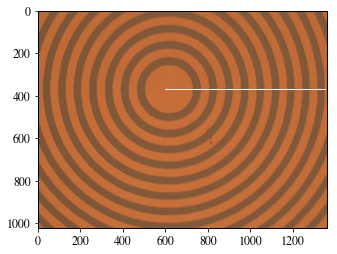

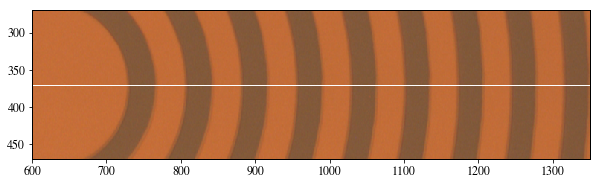

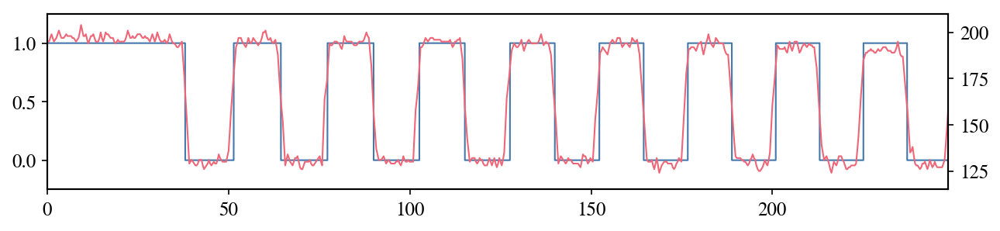

In [15]:
# Optic LO7-A1
plot_lineout(600, 370, 'LO7-A1_3/Center_O3.tif', 3, 6, 0.932, layer1, (115, 210))

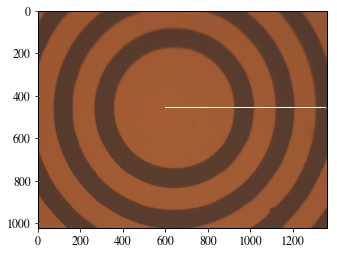

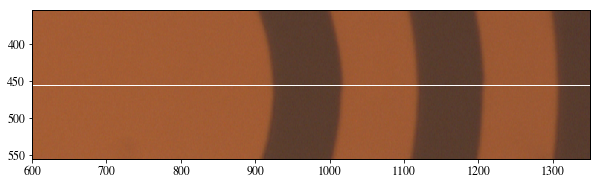

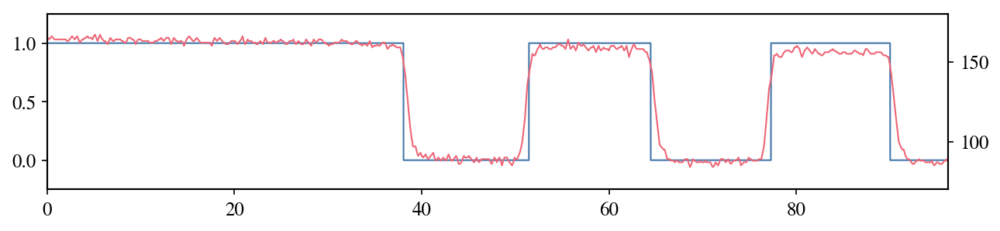

In [16]:
# Optic LO7-A1
plot_lineout(600, 455, 'LO7-A1_3/Center_O4.tif', 4, 6.0, 0.914, layer1, (70, 180))

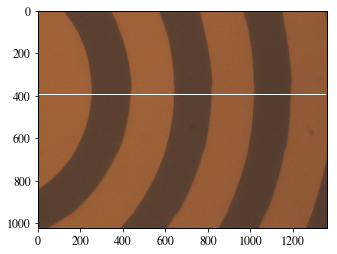

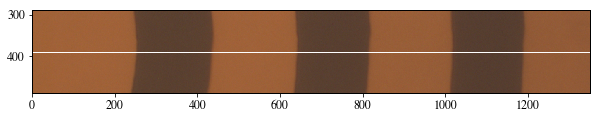

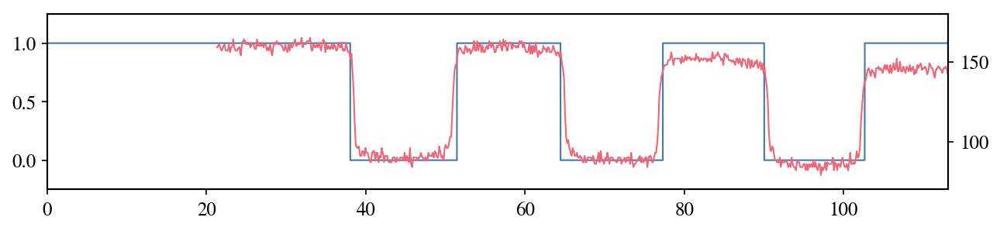

In [17]:
# Optic LO7-A1
plot_lineout(0, 390, 'LO7-A1_3/Center_O5.tif', 5, -23.3, 0.915, layer1, (70, 180))

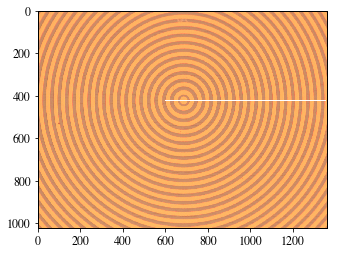

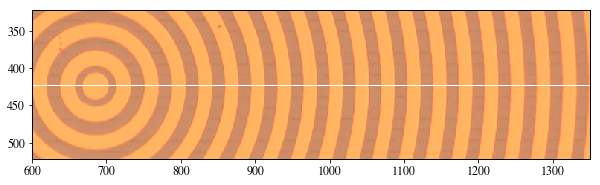

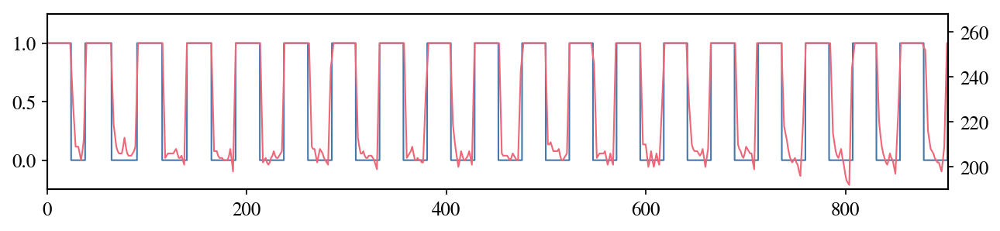

In [18]:
# Optic LO7-A2
plot_lineout(600, 422, 'LO7-A2/Center_O1.tif', 1, 118, 0.98, layer2, (190, 268))

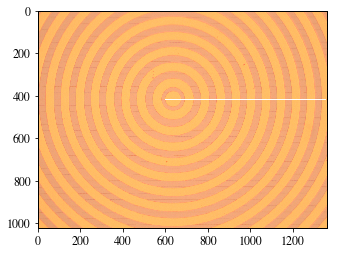

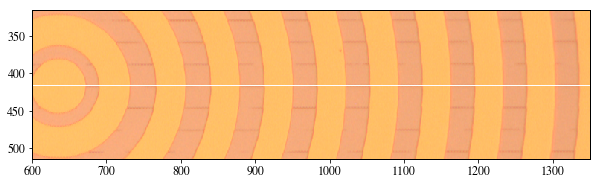

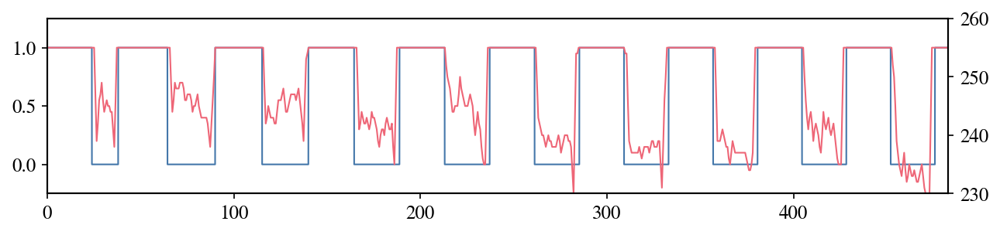

In [19]:
# Optic LO7-A2
plot_lineout(600, 415, 'LO7-A2/Center_O2.tif', 2, 24, 0.98, layer2, (230, 260))

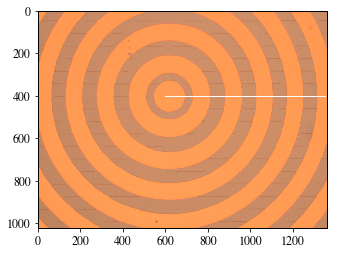

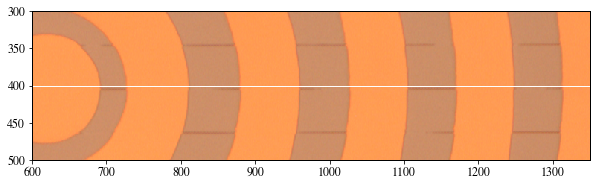

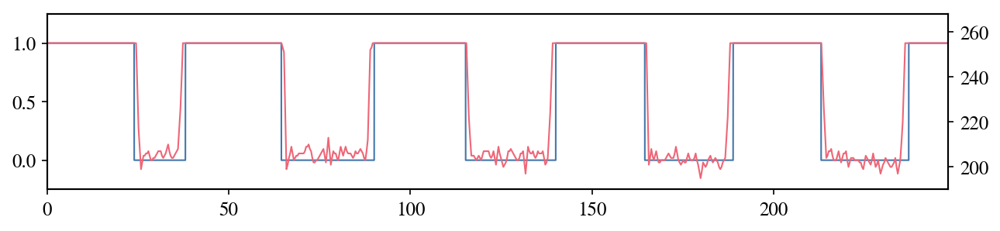

In [20]:
# Optic LO7-A2
plot_lineout(600, 400, 'LO7-A2/Center_O3.tif', 3, 6.5, 0.932, layer2, (190, 268))

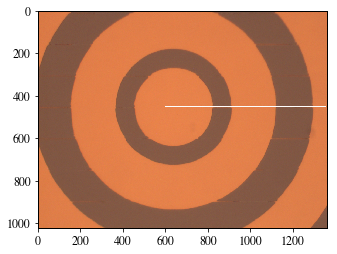

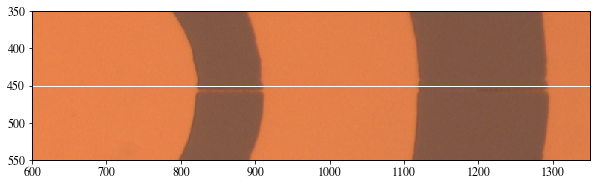

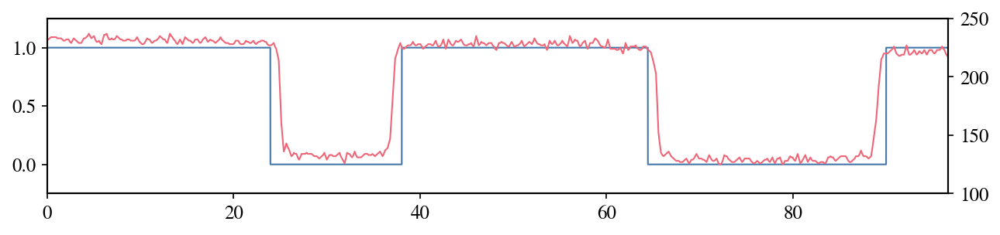

In [21]:
# Optic LO7-A2
plot_lineout(600, 450, 'LO7-A2/Center_O4.tif', 4, 5.5, 0.914, layer2, (100, 250))

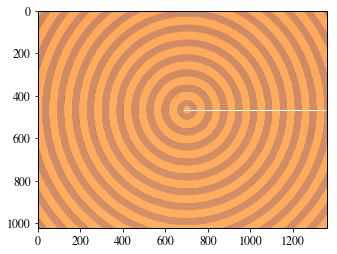

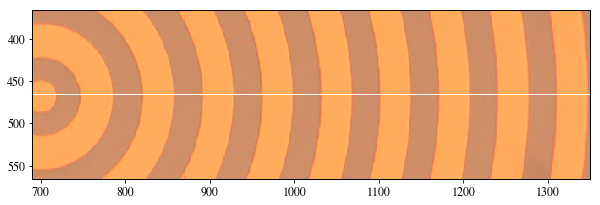

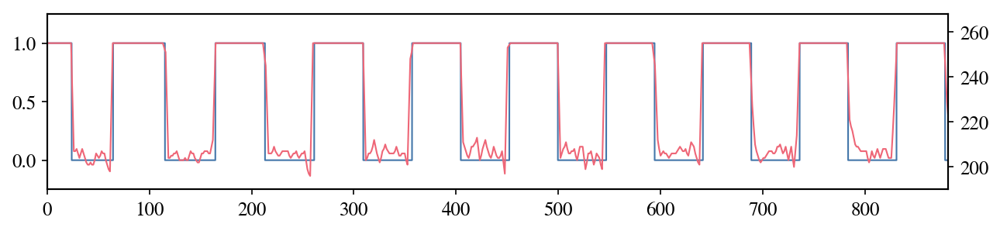

In [22]:
# Optic LO7-A4
plot_lineout(690, 466, 'LO7-A4/Center_O1.tif', 1, 15, 0.98, layer4, (190, 268))

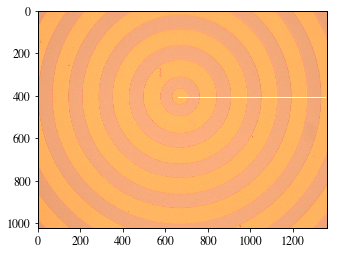

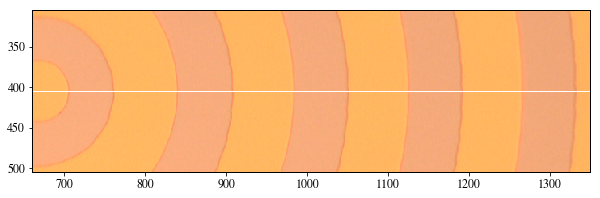

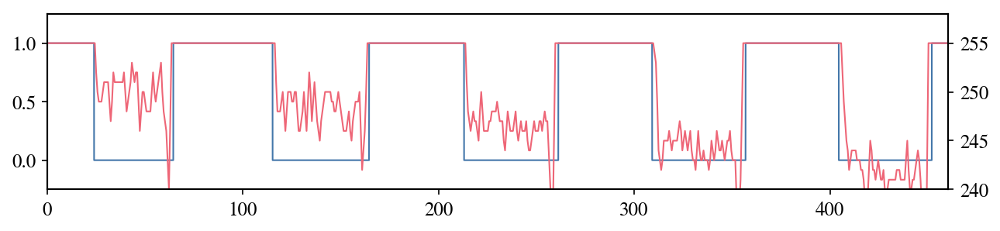

In [23]:
# Optic LO7-A4
plot_lineout(660, 405, 'LO7-A4/Center_O2.tif', 2, 5.5, 0.98, layer4, (240, 258))

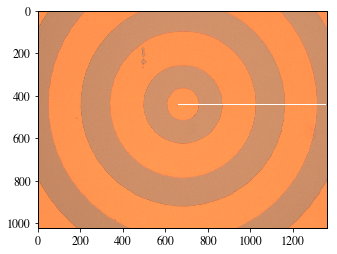

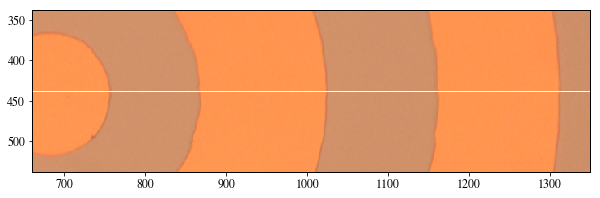

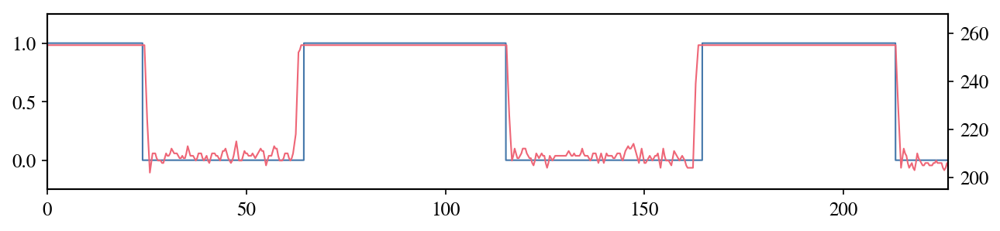

In [24]:
# Optic LO7-A4
plot_lineout(660, 438, 'LO7-A4/Center_O3.tif', 3, 8, 0.932, layer4, (195, 268))

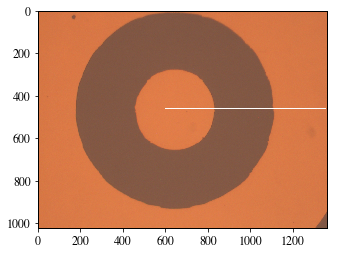

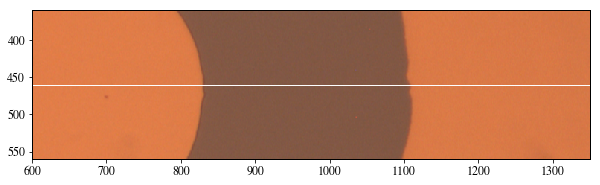

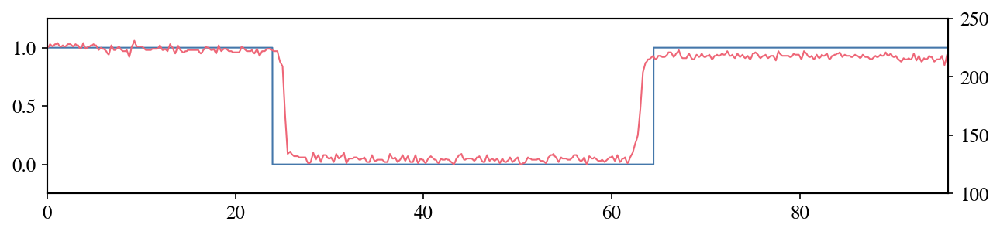

In [25]:
# Optic LO7-A4
plot_lineout(600, 460, 'LO7-A4/Center_O4.tif', 4, 6.5, 0.914, layer4, (100, 250))

In [26]:
layers = 8
min_feature = 2.0
data = np.load(path+'lensB_Phase.npy')
try:
    r = data[0]
    phi = data[1]
except:
    print("The numpy file doesn't have the correct format, it should be an array with:")
    print("[r, phi]")
print("Converting phase into layered rings")
phif = interp1d(r, phi, kind='cubic')
print("Creating nm resolution arrays")
N = int(r[-1]*1000)
# Radius array with exactly one point per nm (nm is base scale of gds)
r_nm = np.linspace(0, N/1000, N, endpoint=False)
phi_nm = phif(r_nm)
phi_nm = phi_nm % (2*np.pi)
phi_d = np.floor(phi_nm*layers/(2*np.pi))

# Parse the phase to find the start and end of each ring
rings = {0 : {'r':0, 'l':0}}
j = 0
phi_cur = 0
for i in range(len(r_nm)):
    if phi_d[i] != phi_cur:
        j += 1
        phi_cur = phi_d[i]
        r_tran = np.round(r_nm[i], 3)
        rings[j] = {'r':r_tran,'l':phi_cur}
        rings[j-1]['rf'] = r_tran
# Have to set the outside of the last ring and make sure it is always large enough
rings[j]['rf'] = r[-1]+min_feature
print("Finished parsing ring boundaries")

print("Converting any undersized features")
del rings[0]
delta = np.zeros(len(rings)-1)
for i in range(1, len(rings)):
    delta[i-1] = rings[i+1]['r']-rings[i]['r']

# Find each region where the phase is changing too fast
small = delta < min_feature
region = {}
j = 0
for i in range(1, len(small)):
    # Beginning of a region
    if small[i] == True and small[i-1] == False:
        region[j] = {'start' : i+1}
    # End of a region
    if small[i] == False and small[i-1] == True:
        region[j]['end'] = i+1
        j += 1
    if i == len(small)-1 and j in region:
        region[j]['end'] = i+2

for i in range(len(region)):
    start_ind = region[i]['start']
    end_ind = region[i]['end']
    start = rings[start_ind]['r']
    end = rings[end_ind]['r']
    # Remove the old rings
    for j in range(start_ind, end_ind):
        del rings[j]
    dr = end - start
    n = int(np.floor(dr / min_feature))
    dr = dr / n
    # Add in new rings
    for j in range(start_ind, start_ind+n):
        r_start = rings[j-1]['r']
        r = np.round(r_start+dr, 3)
        rf = np.round(r+dr, 3)
        sel = np.logical_and(r_nm >= r_start, r_nm < r)
        l = np.floor(np.average(phi_nm[sel])*layers/(2*np.pi))
        rings[j] = {'r':r, 'l':l, 'rf':rf}

Converting phase into layered rings
Creating nm resolution arrays
Finished parsing ring boundaries
Converting any undersized features


In [27]:
layer1 = np.ones(N)
layer2 = np.ones(N)
layer4 = np.ones(N)
Nlayers = 3
for key, ring in rings.items():
    layer = ring['l']
    depth = layers-layer-1
    for k in range(Nlayers):
        etch = 2**(Nlayers-k-1)
        if (depth/etch) >= 1:
            start = int(ring['r']*1000)
            end = int(ring['rf']*1000)
            if etch == 1:
                layer1[start:end] = 0.0
            if etch == 2:
                layer2[start:end] = 0.0
            if etch == 4:
                layer4[start:end] = 0.0
            depth = depth % etch

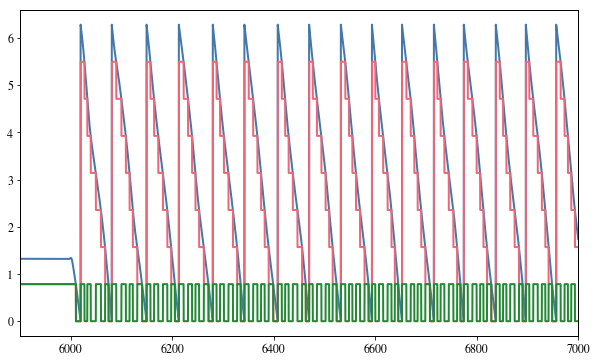

In [28]:
plt.figure(figsize=(10, 6))
plt.plot(r_nm, phi_nm)
plt.plot(r_nm, phi_d/8*2*np.pi)
plt.plot(r_nm, layer1/8*2*np.pi)
plt.xlim(5900, 7000)
plt.show()

In [29]:
def plot_lineout(a, c, filename, o, x0, cor, layer, ylim):
    # Optic LO7-A1
    b = 1350
    dc = 100
    image = Image.open(path+filename)
    #image = image.convert('LA')
    im = np.array(image)

    plt.imshow(image)
    plt.plot([a, b], [c, c], 'w', linewidth=1)
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.imshow(image)
    plt.plot([a, b], [c, c], 'w', linewidth=1)
    plt.xlim(a, b)
    plt.ylim(c+dc, c-dc)
    plt.show()

    x0=x0-6000
    x = ((np.arange(a, b)-a)*pixel_width[o-1]-x0)*cor
    plt.figure(figsize=(10, 2), dpi=150)
    im = np.array(image)
    plt.plot(r_nm, layer, linewidth=1.0)
    plt.ylim(-0.25, 1.25)
    plt.twinx()
    plt.plot(x, im[c, a:b, 0], 'C1', linewidth=1.0)
    plt.xlim(5990, x[-1])
    plt.ylim(ylim)
    plt.show()

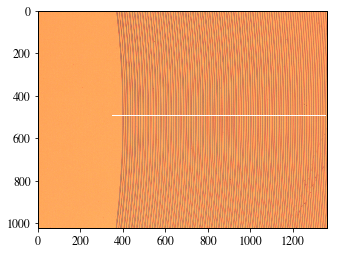

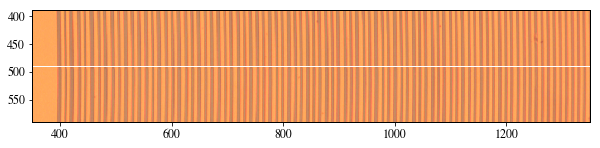

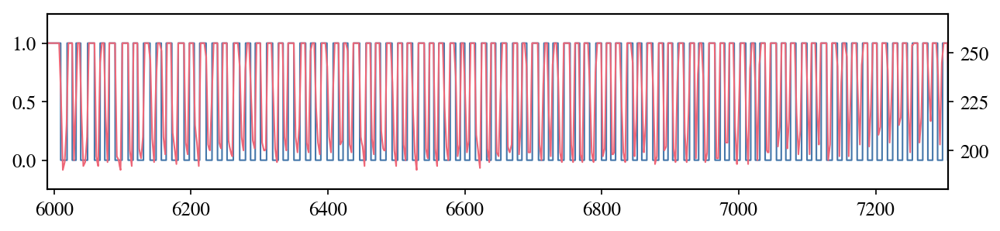

In [30]:
# Optic LO7-B1
plot_lineout(350, 490, 'LO7-B1/Transition_O1.tif', 1, -69, 0.98, layer1, (180, 270))

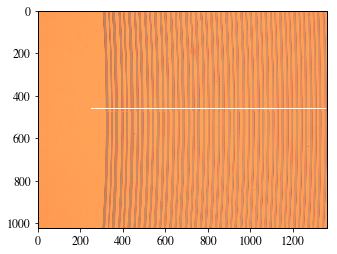

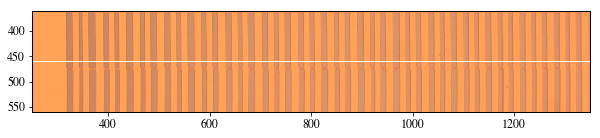

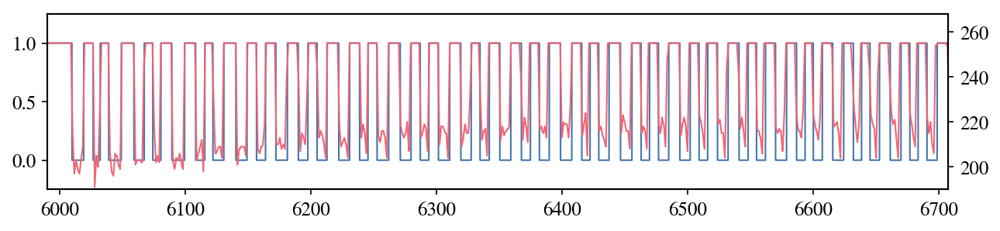

In [31]:
# Optic LO7-B1
plot_lineout(250, 460, 'LO7-B1/Transition_O2.tif', 2, -86, 0.98, layer1, (190, 268))

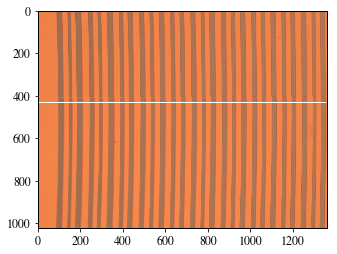

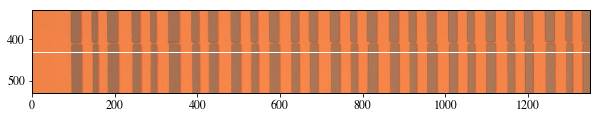

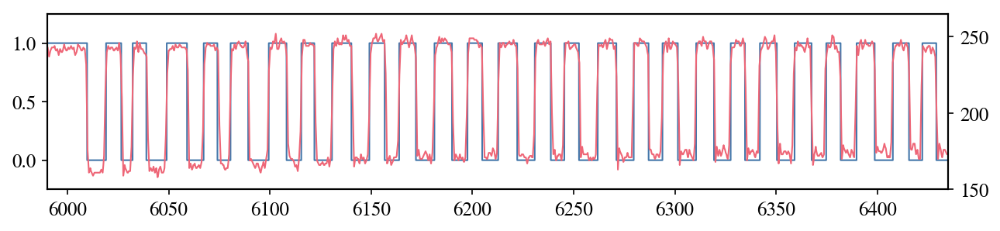

In [32]:
# Optic LO7-B1
plot_lineout(0, 430, 'LO7-B1/Transition_O3.tif', 3, -413.5, 0.932, layer1, (150, 265))

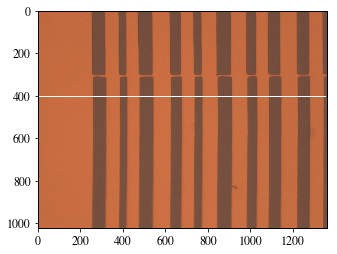

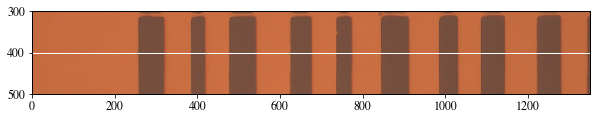

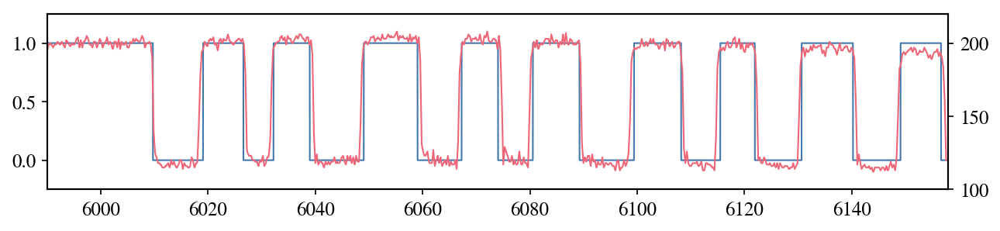

In [33]:
# Optic LO7-B1
plot_lineout(0, 400, 'LO7-B1/Transition_O4.tif', 4, -537, 0.914, layer1, (100, 220))

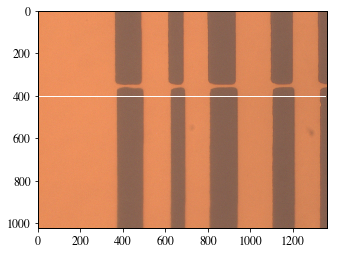

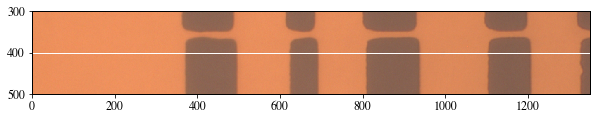

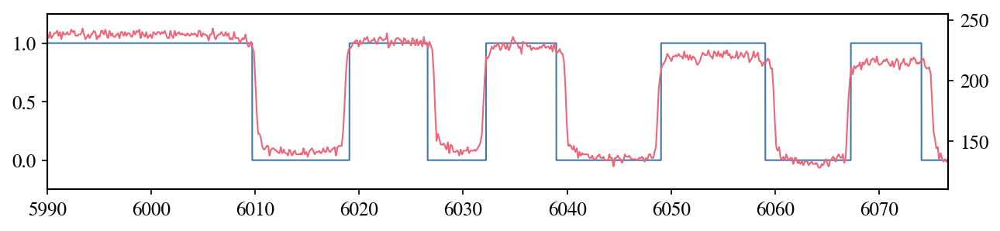

In [34]:
# Optic LO7-B1
plot_lineout(0, 400, 'LO7-B1/Transition_O5.tif', 5, -540.8, 0.915, layer1, (110, 255))

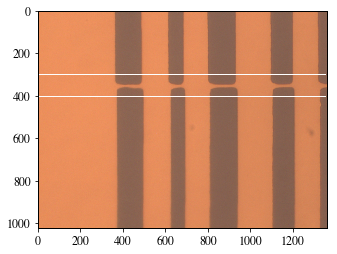

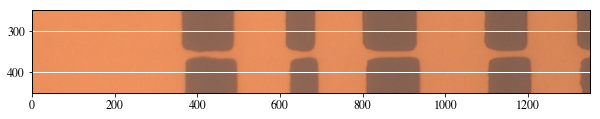

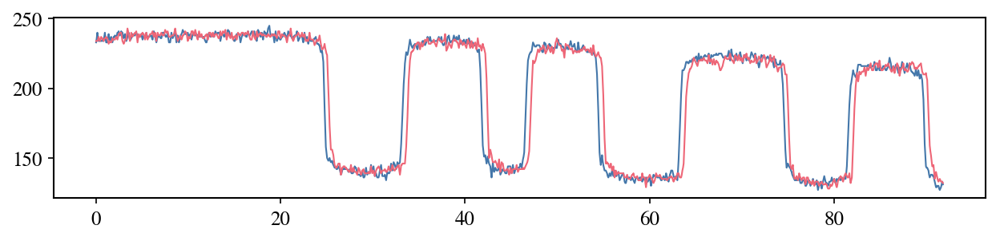

[33.2451945  41.79926094 46.60040225 54.43836148 63.37532335 74.5563197
 81.65875311 89.73380109]
[25.25727268 33.79430991 42.42491675 47.13862768 55.03573593 63.93080362
 75.0368521  82.22086163 90.23251465]
[0.5491154  0.62565582 0.53822542 0.59737444 0.55548028 0.48053239
 0.56210852 0.49871356]
Average offset 0.551um


In [52]:
# Figure out the offset at the transition
a = 0
c = 300
c2 = 400
filename = 'LO7-B1/Transition_O5.tif'
o = 5
cor = 0.915
b = 1350
dc = 100
image = Image.open(path+filename)
#image = image.convert('LA')
im = np.array(image)

plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.plot([a, b], [c2, c2], 'w', linewidth=1)
plt.show()

plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.plot([a, b], [c, c], 'w', linewidth=1)
plt.plot([a, b], [c2, c2], 'w', linewidth=1)
plt.xlim(a, b)
plt.ylim(0.5*(c+c2)+dc, 0.5*(c+c2)-dc)
plt.show()

x = ((np.arange(a, b)-a)*pixel_width[o-1])*cor
plt.figure(figsize=(10, 2), dpi=150)
im = np.array(image)
plt.plot(x, im[c, a:b, 0], 'C0', linewidth=1.0)
plt.plot(x, im[c2, a:b, 0], 'C1', linewidth=1.0)
plt.show()

def find_roots(x, y):
    y = y-np.min(y)
    spline = UnivariateSpline(x, y-np.max(y)/2, s=0)
    roots = spline.roots()
    return roots
r1 = find_roots(x, im[c, a:b, 0])
r2 = find_roots(x, im[c2, a:b, 0])
print(r1)
print(r2)
print(r2[1:]-r1)
print('Average offset %0.3fum' % np.average(r2[1:]-r1))

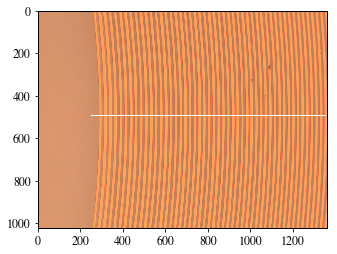

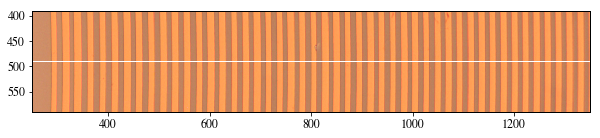

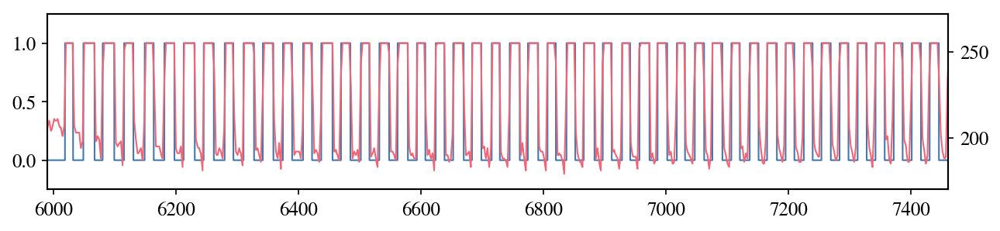

In [36]:
# Optic LO7-B2
plot_lineout(250, 490, 'LO7-B2/Side_O1.tif', 1, -88, 0.98, layer2, (170, 272))

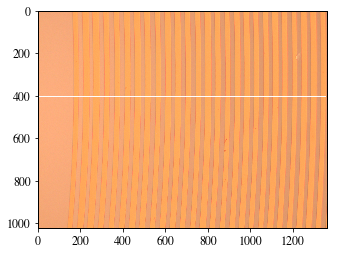

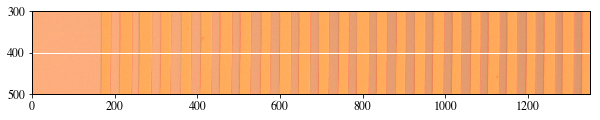

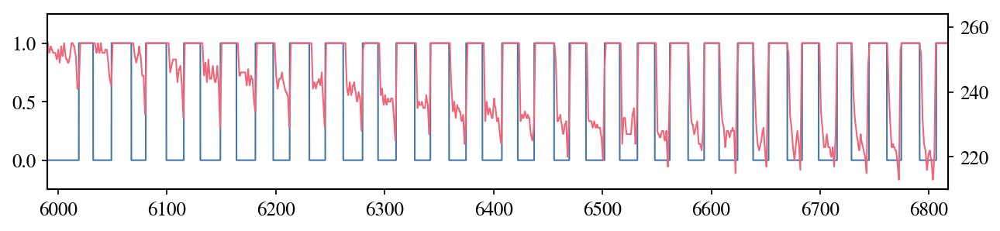

In [37]:
# Optic LO7-B2
plot_lineout(0, 400, 'LO7-B2/Side_O2.tif', 2, -26, 0.98, layer2, (210, 264))

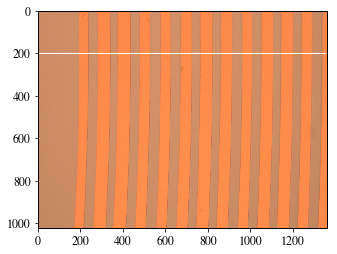

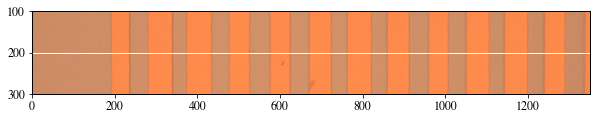

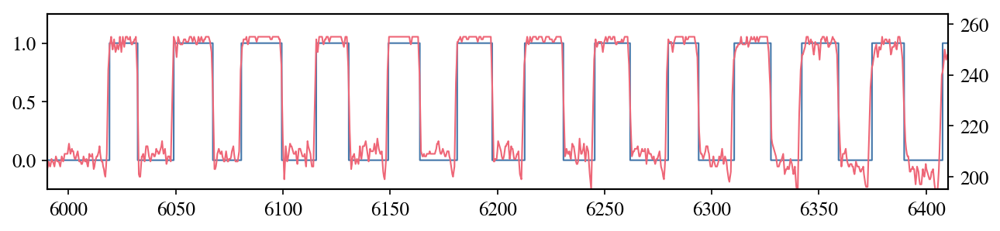

In [38]:
# Optic LO7-B2
plot_lineout(0, 200, 'LO7-B2/Side_O3.tif', 3, -387, 0.932, layer2, (195, 264))

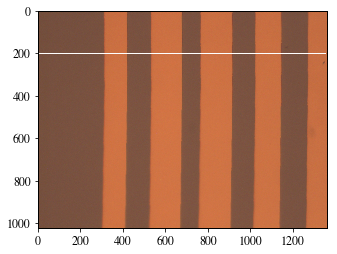

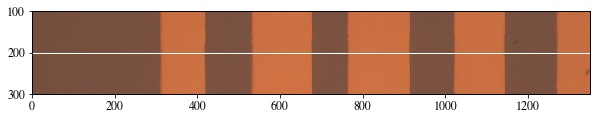

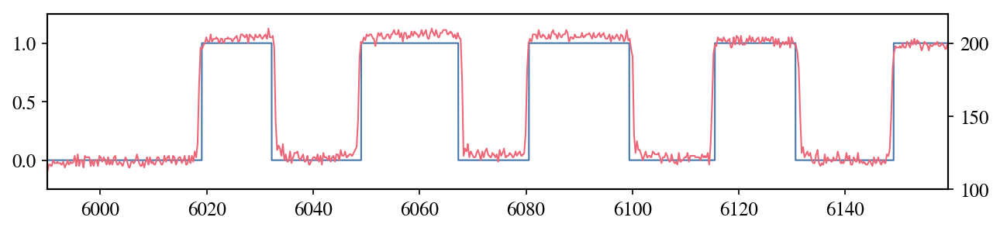

In [39]:
# Optic LO7-B2
plot_lineout(0, 200, 'LO7-B2/Side_O4.tif', 4, -538.5, 0.914, layer2, (100, 220))

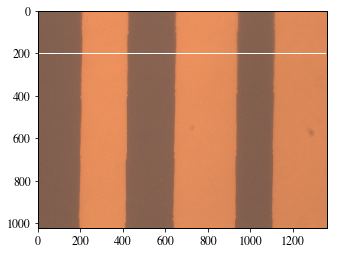

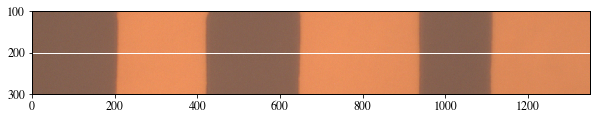

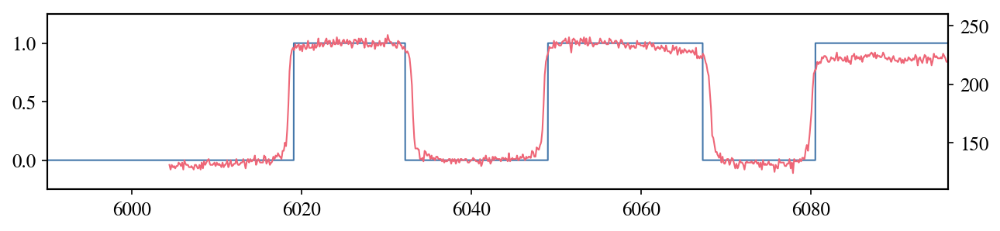

In [40]:
# Optic LO7-B2
plot_lineout(0, 200, 'LO7-B2/Side_O5.tif', 5, -562.2, 0.915, layer2, (110, 260))

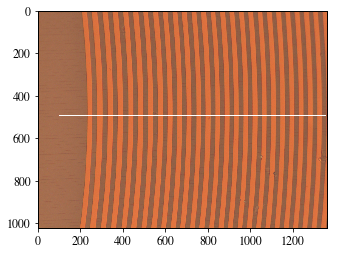

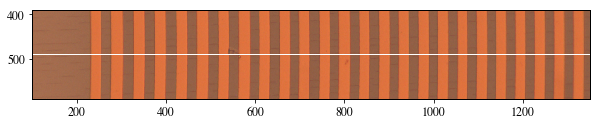

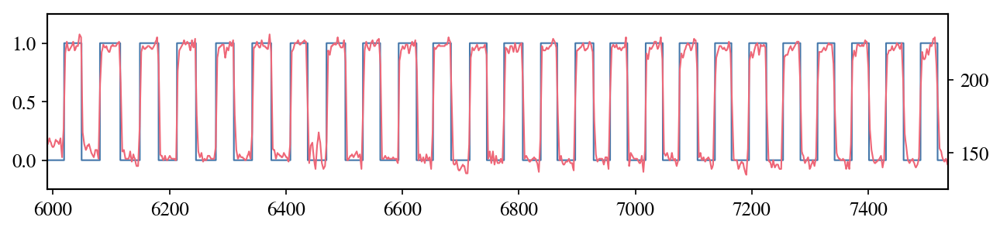

In [41]:
# Optic LO7-B4
plot_lineout(100, 490, 'LO7-B4/Side_O1.tif', 1, 42, 0.98, layer4, (125, 245))

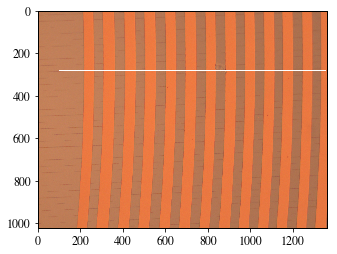

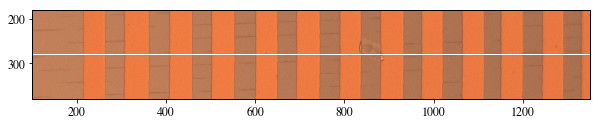

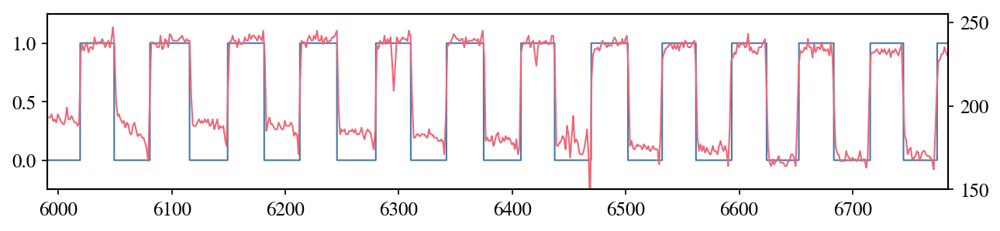

In [42]:
# Optic LO7-B4
plot_lineout(100, 280, 'LO7-B4/Side_O2.tif', 2, -61, 0.98, layer4, (150, 255))

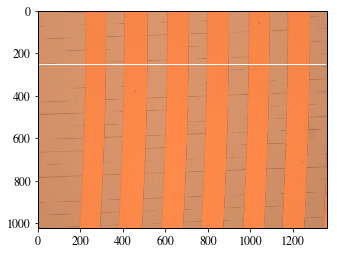

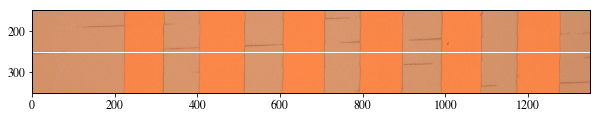

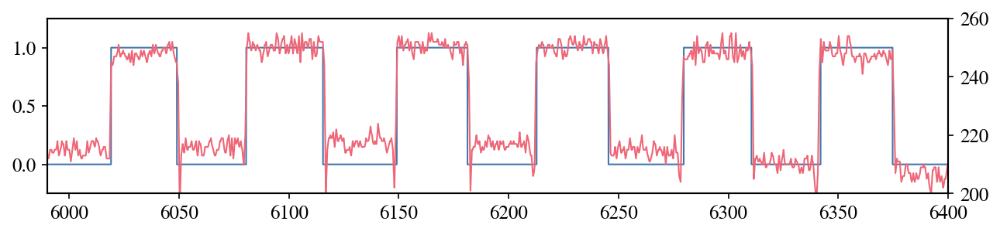

In [43]:
# Optic LO7-B4
plot_lineout(0, 250, 'LO7-B4/Side_O3.tif', 3, -376, 0.932, layer4, (200, 260))

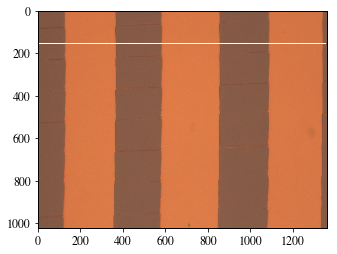

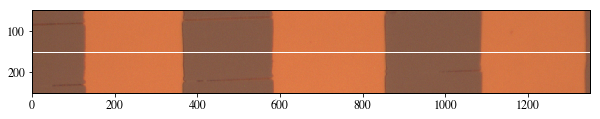

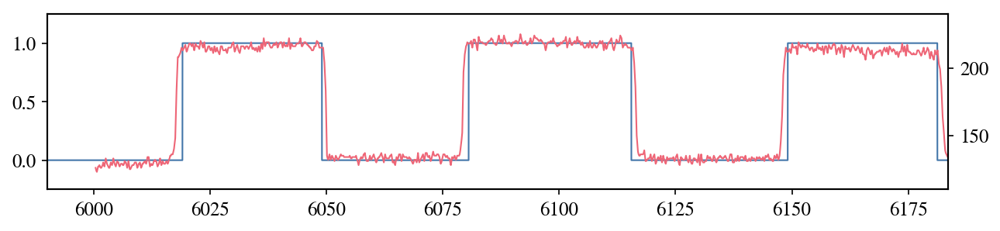

In [44]:
# Optic LO7-B4
plot_lineout(0, 150, 'LO7-B4/Side_O4.tif', 4, -565, 0.914, layer4, (110, 240))

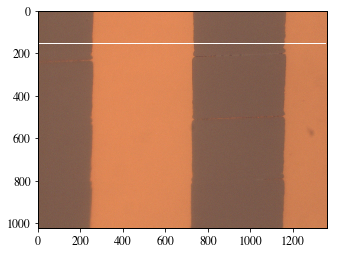

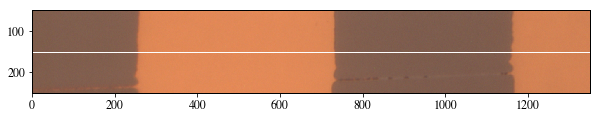

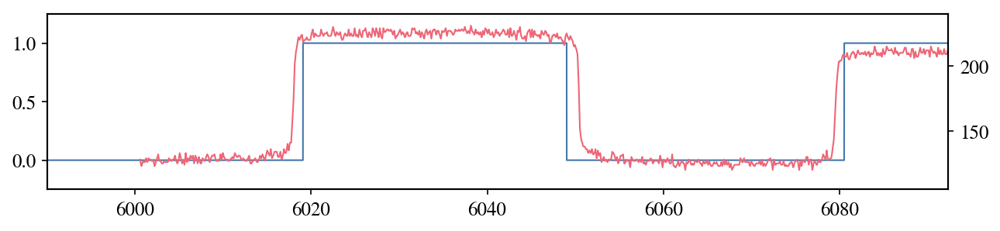

In [45]:
# Optic LO7-B4
plot_lineout(0, 150, 'LO7-B4/Side_O5.tif', 5, -558, 0.915, layer4, (105, 240))

In [46]:
multiplier = np.array([0.98, 0.98, 0.932, 0.914, 0.915])
print(pixel_width)
print(pixel_width*multiplier)
# Each lens clearly doubles the resolution
base = np.zeros(5)
for i in range(5):
    base[i] = pixel_width[i]*multiplier[i]/2**(4-i)
print(base)
print('Base for objectives 1-3:', np.average(base[:3]))
print('Base for objectives 4,5:', np.average(base[3:]))
pixels = np.zeros(5)
pixels[:3] = np.average(base[:3])*np.array([16, 8, 4])
pixels[3:] = np.average(base[3:])*np.array([2, 1])
print(pixels)

[1.38765724 0.69002105 0.36401291 0.14857907 0.07438348]
[1.3599041  0.67622063 0.33926003 0.13580127 0.06806088]
[0.08499401 0.08452758 0.08481501 0.06790063 0.06806088]
Base for objectives 1-3: 0.08477886454301109
Base for objectives 4,5: 0.06798075721764874
[1.35646183 0.67823092 0.33911546 0.13596151 0.06798076]
